# Unsupervised Learning Methods
## Outline 
#### 1. Text similarity: cosine similarity, summary extraction
#### 2. Text clusttering: K-mean, visualization with PCA, t-SNE, MDS
#### 3. Build Recommender System

In [1]:
%matplotlib inline

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm 
import plotly.express as px
from PIL import Image

from scipy.stats import entropy
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error
from sklearn.metrics.pairwise import linear_kernel
from sklearn.neighbors import NearestNeighbors
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE, MDS

from nltk.corpus import stopwords
import nltk
from wordcloud import WordCloud, STOPWORDS

import re
import string

In [2]:
# download and create the stopwords
nltk.download('stopwords')
add_stopwords = {'well', 'nice', 'good', 'excellent', 'better', 'big', 'great', 'well',
                 'taste', 'note', 'notes', 'nose', 'palate', 'aroma', 'flavor', 'color', 'body',
                 'finish', 'year', 'drink', 'long', 'still', 'like', 'one', 'hint', 'hour', 'month',
                 'wine', 'bottle'}
stopwords_list = list(set(stopwords.words('english')) | set(stopwords.words('french')) | set(stopwords.words('italian')) | set(stopwords.words('german')) | set(stopwords.words('portuguese')) | set(stopwords.words('spanish')) | add_stopwords)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\ymsc1\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
# get reviews and perform text vectorization
df = pd.read_pickle("asset/cleaned_reviews.pkl")

def get_reviews_vectorized(df, top_n=-1, ngram_range=(1, 1), max_features=1000):
    review_instances = df.Review.replace('\d+'," ", regex=True)
    review_instances = review_instances.replace(r'\n',' ', regex=True)

    vectorizer = TfidfVectorizer(
        max_df=0.3,
        max_features=max_features,
        min_df=10,
        stop_words=stopwords_list,
        ngram_range=ngram_range,
        use_idf=True,
    )
    if top_n >= 0:
        review_instances = review_instances.values[0:top_n]
        df = df[0:top_n]
    else:
        review_instances = review_instances.values


    X = vectorizer.fit_transform(review_instances)

    return (X, vectorizer, review_instances, df)

In [4]:
(X, vectorizer, review_instances, df) = get_reviews_vectorized(df, -1, (1, 2))

## 1. Text similarity

In [5]:
cosine_similarities = linear_kernel(X, X)

In [6]:
def recommend(name, cosine_similarities = cosine_similarities):
   
    df_list = df.set_index('name')
    indices = pd.Series(df_list.index)

    recommend = []
    
    # Find the index of the input
    idx = indices[indices == name].index[0]
    
    # Find the wines with a similar cosine-sim value and order them from bigges number
    score_series = pd.Series(cosine_similarities[idx]).sort_values(ascending=False)
    
    # Extract top 30 wine indexes with a similar cosine-sim value
    top30_indexes = list(score_series.iloc[0:31].index)
    
    # Names of the top 30 wines
    for each in top30_indexes:
        recommend.append(list(df_list.index)[each])
    
    # Creating the new data set to show similar wines
    df_new = pd.DataFrame(columns=['country', 'winery', 'price', 'rating'])
    
    # Create the top 30 similar wines with some of their columns
    for each in recommend:
        df_new = df_new.append(pd.DataFrame(df_list[df_list.index == each]))
    
    # Drop the same named wines and sort only the top 10 by the highest rating
    df_new = df_new.drop_duplicates(subset=['country', 'winery', 'price', 'rating'], keep=False)
    df_new = df_new.sort_values(by='rating', ascending=False).head(10)
    
    print('Top %s wines like %s with similar reviews: ' % (str(len(df_new)), name))
    
    return df_new



def sample():
    select = df.sample(n=1)
    name = select['name'].item()
    print('Select %s ' % name)
    
    return select



def make_wordcloud(text, stop_words, mask):
    # Generate a word cloud image
    wine_mask = np.array(Image.open(mask))
    wordcloud = WordCloud(width = 1200, height = 1200, stopwords=stop_words, scale=10, 
                        colormap = 'YlOrRd', background_color ='black', mask=wine_mask, max_words=50).generate(text)
    plt.figure(figsize=(8,8))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()



In [7]:
select = sample()
select

Select O Esteiro Tinto 2017 


,name,year,wine ID,rating,price,winery,image,Review,country
5240,O Esteiro Tinto 2017,2017,2595942,3.7,20.462472,Albamar,//images.vivino.com/thumbs/ZZK7d0cqSA-ObOwlXXw...,Very nice light terroir craft wine without oak...,Spain


In [8]:
select_name = select.name.item()
recomendation = recommend(select_name)
recomendation

Top 10 wines like O Esteiro Tinto 2017 with similar reviews: 


C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\3875708878.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(pd.DataFrame(df_list[df_list.index == each]))
C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\3875708878.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(pd.DataFrame(df_list[df_list.index == each]))
C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\3875708878.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_new = df_new.append(pd.DataFrame(df_list[df_list.index == each]))
C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\3875708878.py:26: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas

,country,winery,price,rating,year,wine ID,image,Review
Pinot Noir 2019,Argentina,Rutini,33.847103,4.4,2019,1398984.0,//images.vivino.com/thumbs/HfAnExKnTTSkixIkESm...,"Red hot velvet pepper, what’s the buzz though?..."
Gevrey-Chambertin 2018,France,Domaine Thierry Mortet,52.510459,4.3,2018,80389.0,//images.vivino.com/thumbs/3sSAfIKkRWyzUYX1SIQ...,16/20 best out of 3 Great with the turkey! Ba...
Pinot Noir 2019,United States,Flowers,50.000000,4.3,2019,4724.0,//images.vivino.com/thumbs/TfJacFxcSoaNd8AT8T1...,Exactly the Pinot it should be for the price p...
Chambolle-Musigny 2018,France,Domaine Faiveley,105.126795,4.3,2018,1109289.0,//images.vivino.com/thumbs/TRO__X2wQGqo0JHrsz5...,"Raspberries, mulberries, dark plum, minerality..."
Sancerre Rouge 2020,France,Domaine Vacheron,33.214447,4.3,2020,1100748.0,//images.vivino.com/thumbs/1ddimyy9Q62tgqW9I2W...,Appearance: pale lemon\nOn the nose: medium in...
Gevrey-Chambertin 2018,France,Domaine Duroché,118.810880,4.2,2018,95020.0,//images.vivino.com/thumbs/QgyXq8WJQeyL-xGKICs...,4.3\n\nAt least 2~3 hours of breathing in deca...
Gevrey-Chambertin 2018,France,Domaine Trapet,141.129123,4.2,2018,1131396.0,//images.vivino.com/thumbs/BRkpg8Y8QgqZMak9wyy...,Informal mixed bag wine tasting event in Oslo....
Chambolle-Musigny 2018,France,Hudelot-Noëllat,129.608378,4.2,2018,1127398.0,//images.vivino.com/thumbs/VgIMJBaiQci4x08eq5I...,Nose: strawberry jam cranberry pepper blackber...
Sancerre Rouge 2018,France,Domaine Vacheron,29.606330,4.2,2018,1100748.0,//images.vivino.com/thumbs/1ddimyy9Q62tgqW9I2W...,"A Pinot Noir from Sancerre. Unoaked, pure and ..."
Gevrey-Chambertin 2018,France,Joseph Drouhin,60.201185,4.2,2018,24109.0,//images.vivino.com/thumbs/6NhkR3EiQduwuK15vki...,cherry / lightly oaky / flowerish / but its to...


This is the wordcloud of the select wine looks like...


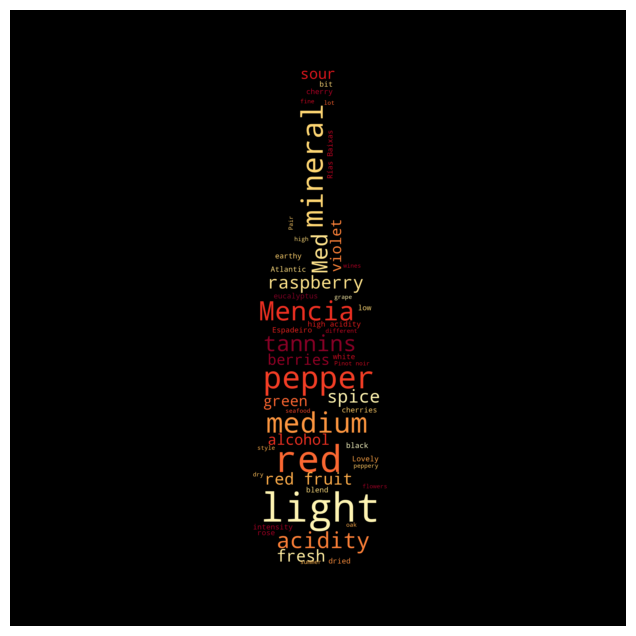

This is the wordcloud of the recommendation list looks like...


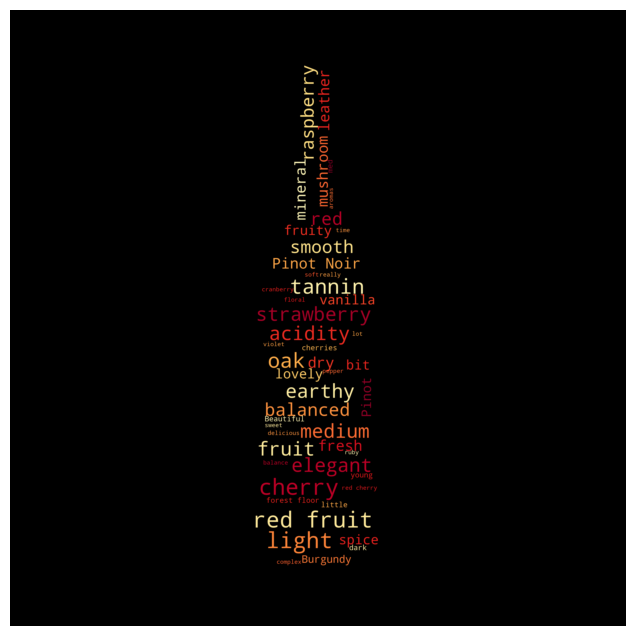

In [9]:
recomendation_review = ' '.join(recomendation.Review.tolist())
select_review = select.Review.item()
print('This is the wordcloud of the select wine looks like...')
make_wordcloud(select_review, stopwords_list, "picture/wine_image.jpg")
print('This is the wordcloud of the recommendation list looks like...')
make_wordcloud(recomendation_review, stopwords_list, "picture/wine_image.jpg")

## 2. Text clusttering

#### Firstly, try k-means by two categories.

In [10]:
def kmeans_review_k_2():
    result = None
   
    X_ar = X.toarray()
    km = KMeans(n_clusters=2, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    centroids = km.cluster_centers_
    features = vectorizer.get_feature_names()    
    sorted_centroid_features_idx = centroids.argsort(axis=1)[:,::-1]    
    top10_clust1 = [features[feature_idx] for feature_idx in sorted_centroid_features_idx[0]][:10]
    top10_clust2 = [features[feature_idx] for feature_idx in sorted_centroid_features_idx[1]][:10]
    result = [top10_clust1, top10_clust2]

    return result


kmeans_review_k_2()

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


[['barolo',
  'brunello',
  'syrah',
  'rioja',
  'pinot',
  'sangiovese',
  'cabernet sauvignon',
  'margaux',
  'franc',
  'shiraz'],
 ['champagne',
  'pear',
  'bubbles',
  'green apple',
  'yellow',
  'brioche',
  'chardonnay',
  'grapefruit',
  'lime',
  'apples']]

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


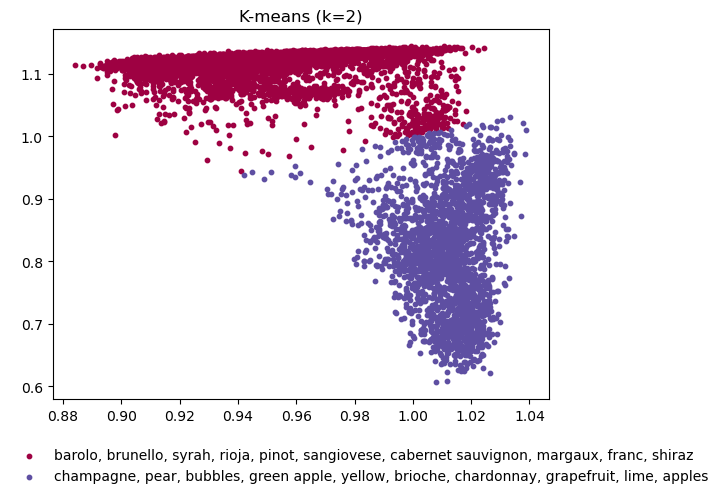

In [11]:
# from matplotlib.legend_handler import HandlerLine2D, HandlerTuple


def scatter_plot():
    colors = cm.Spectral(np.linspace(0, 1, 2))
    cdict = {0: colors[0], 1: colors[1]}
    
    X_ar = X.toarray()
    km = KMeans(n_clusters=2, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    X_km = km.transform(X_ar)
    y = km.fit_predict(X_ar)
    label1 = ', '.join(kmeans_review_k_2()[0])
    label2 = ', '.join(kmeans_review_k_2()[1])

    fig, ax = plt.subplots()
    for cls in np.unique(y):
        ix = np.where(y == cls)
        ax.scatter(X_km[ix, 0], X_km[ix, 1], color = cdict[cls], label = cls, s = 10)
    ax.legend((label1, label2), bbox_to_anchor=(-0.1, -0.1), loc='upper left', frameon=False)
    ax.set_title('K-means (k=2)')
    plt.show()


scatter_plot()

In [12]:
', '.join(kmeans_review_k_2()[0])

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


'barolo, brunello, syrah, rioja, pinot, sangiovese, cabernet sauvignon, margaux, franc, shiraz'

In [13]:
def km_2_by_plotly(X, title):
    X_ar = X.toarray()
    km = KMeans(n_clusters=2, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    X_km = km.transform(X_ar)
    y = km.fit_predict(X_ar)

    labels = [', '.join(wd) for wd in np.array(kmeans_review_k_2())[y]] 
    df_km = pd.DataFrame(X_km, columns=['x', 'y'])
    df_km['labels'] = labels
    df_plot = pd.concat([df_km, df], axis=1)


    fig = px.scatter(
    df_plot, x='x', y='y',
    color='labels', title=title, 
    hover_data=['name', 'country', 'winery', 'price', 'rating']
    )
    fig.write_html("plotly/%s.html" % title)
    fig.show()

km_2_by_plotly(X, 'K-means')

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


#### Interesting! It seems the k-means finds two discrete categories, the "red" and the "white"! There are more categories for wines! <br>We want to explore the optimal number of clusters using the elbow method. 

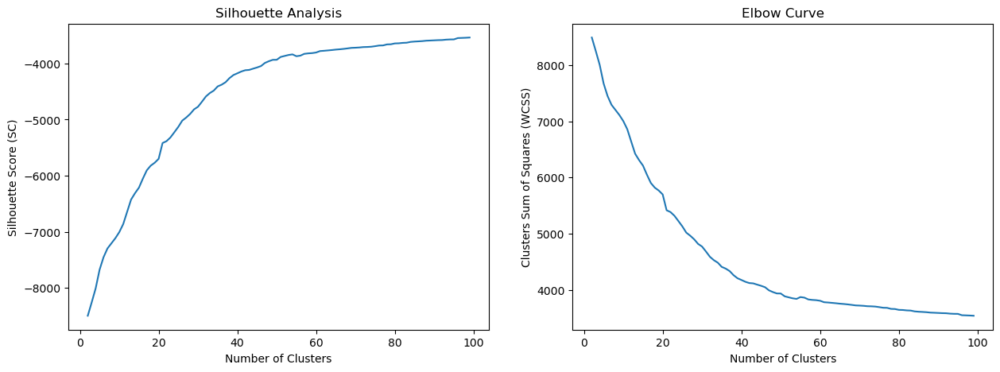

In [14]:
# elbow curve for exploring k values for KNN
fig, axes = plt.subplots(1, 2, figsize=(15, 5))
X_ar = X.toarray()
Nc = range(2, 100)

kmeans = [KMeans(n_clusters=i, init='k-means++', max_iter=100, n_init=1, random_state=42) for i in Nc]
sc = [kmeans[i].fit(X_ar).score(X_ar) for i in range(len(kmeans))]
wcss = [kmeans[i].fit(X_ar).inertia_ for i in range(len(kmeans))]



axes[0].plot(Nc,sc)
axes[0].set_xlabel('Number of Clusters')
axes[0].set_ylabel('Silhouette Score (SC)')
axes[0].set_title('Silhouette Analysis')

axes[1].plot(Nc,wcss)
axes[1].set_xlabel('Number of Clusters')
axes[1].set_ylabel('Clusters Sum of Squares (WCSS)')
axes[1].set_title('Elbow Curve')


plt.show()

#### The optimal number of clustters is near 30. We set k=30 for the K-means. <br>Next, we want create labels for each cluster by extracting discrete words in the reviews of each wine.

In [15]:
k_val=30

In [16]:
def compute_distinctive_term_score(T, T_a):
    # First compute information gain.
    IG = entropy(T) - entropy(T_a)

    # if it's high IG, but not for this class, we want to penalize,
    # so flip the IG negative.  We do this because these are terms those whose *absence* is notable,
    # but we don't care about those for purposes of this assignment and so we give them
    # a score that guarantees we won't rank them highly.
    if T_a[0] < T_a[1]:
        score = -IG
    else:
        score = IG
    return score


# create a 1-vs-all two-class matrix for each cluster
def one_vs_all_count_matrix(m, index):
    # row zero is the selected row
    row0 = m[index, :]
    # row one is the other rows summed
    row1 = np.vstack((m[0:index, :], m[index + 1 :, :])).sum(axis=0)

    result = np.vstack((row0, row1))
    return result

In [17]:
def answer_cluster_labeling(n_clusters):
    result = None

    X_ar = X.toarray()
    km = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    centroids = km.cluster_centers_
    ig = np.empty([n_clusters, 1000])
    for c in range(n_clusters):
        tc = one_vs_all_count_matrix(centroids, c).sum(axis=1)/one_vs_all_count_matrix(centroids, c).sum(axis=1).sum(axis=0)
        for w in range(1000):
            tw = one_vs_all_count_matrix(centroids, c)[:,w]/one_vs_all_count_matrix(centroids, c).sum(axis=0)[w]
            ig[c,w] = compute_distinctive_term_score(tc, tw)
    features = vectorizer.get_feature_names()    
    sorted_ig_idx = ig.argsort(axis=1)[:,::-1] 
    result = []
    for c in range(n_clusters):
        result.append([features[feature_idx] for feature_idx in sorted_ig_idx[c]][:5])
    return result


answer_cluster_labeling(k_val)

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



[['sav', 'bordeaux blend', 'california', 'cab franc', 'cab sauv'],
 ['yeasty', 'yeast', 'pastry', 'lees', 'bread'],
 ['burgundy',
  'pale ruby',
  'strawberry cherry',
  'raspberry strawberry',
  'strawberry raspberry'],
 ['grenache', 'garnacha', 'rhône', 'rhone', 'southern'],
 ['rosso', 'vino', 'italy', 'bordeaux blend', 'friday'],
 ['citrus minerals', 'pear peach', 'pear apple', 'lemon green', 'pear citrus'],
 ['roses', 'rose petal', 'petal', 'rose petals', 'petals'],
 ['reserva', 'gran', 'tempranillo', 'garnacha', 'modern'],
 ['left bank', 'pv', 'verdot', 'petit verdot', 'sauvignon merlot'],
 ['growth', 'chateau', 'pv', 'left bank', 'grand cru'],
 ['rosso', 'sangiovese', 'friday', 'medium garnet', 'tuscany'],
 ['rose petal', 'petal', 'roses', 'nebbiolo', 'rose petals'],
 ['raisins', 'walnut', 'figs', 'dried fruits', 'toffee'],
 ['raisins',
  'cherry chocolate',
  'dried fruit',
  'chocolate plum',
  'chocolate oak'],
 ['spain', 'spanish', 'reserva', 'american', 'vanilla blackberry']

In [18]:
def answer_manifold_a():
    result = None

    # YOUR CODE HERE
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)

    pca = PCA(n_components=2, random_state = 42)
    X_pca = pca.fit_transform(X_ar)
    
    tsne = TSNE(n_components=2, random_state = 42)
    X_tsne = tsne.fit_transform(X_ar)
    
    mds = MDS(n_components=2, random_state = 42)
    X_mds = mds.fit_transform(X_ar)

    result = (X_pca, X_tsne, X_mds)
    return result

X_pca, X_tsne, X_mds = answer_manifold_a()

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 

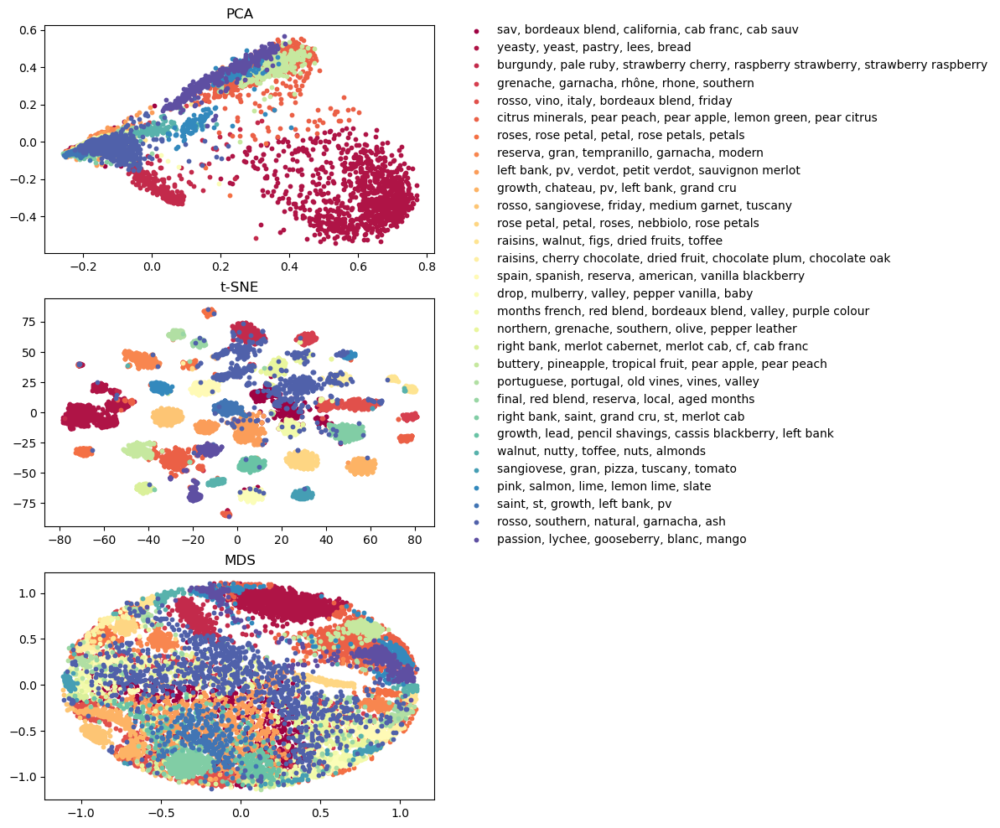

In [19]:
def plot_manifolds():
    colors = cm.Spectral(np.linspace(0, 1, 30))
    fig, ax = plt.subplots(3, 1, figsize=(6, 12))

    X_ar = X.toarray()
    km = KMeans(n_clusters=30, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    y = km.fit_predict(X_ar)
    labels = [', '.join(answer_cluster_labeling(30)[i]) for i in range(30)]


    for cls in np.unique(y):
        ix = np.where(y == cls)
        ax[0].scatter(X_pca[ix, 0], X_pca[ix, 1], color = colors[cls], label = cls, s = 10)
        ax[0].set_title('PCA')

        ax[1].scatter(X_tsne[ix, 0], X_tsne[ix, 1], color = colors[cls], label = cls, s = 10)
        ax[1].set_title('t-SNE')

        ax[2].scatter(X_mds[ix, 0], X_mds[ix, 1], color = colors[cls], label = cls, s = 10)
        ax[2].set_title('MDS')
    plt.legend(labels, bbox_to_anchor=(1.05, 3.45), loc='upper left', frameon=False)
    plt.show()

plot_manifolds()

#### Same visualizations build on Plotly. Enjoy the interactive experiences!

In [20]:
def scatterplot_by_plotly(X, manifolds, title):
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    y = km.fit_predict(X_ar)
    labels = [', '.join(wd) for wd in np.array(answer_cluster_labeling(k_val))[y]] 
    df_manifolds = pd.DataFrame(manifolds, columns=['x', 'y'])
    df_manifolds['labels'] = labels
    df_plot = pd.concat([df_manifolds, df], axis=1)


    fig = px.scatter(
    df_plot, x='x', y='y',
    color='labels', title=title, 
    hover_data=['name', 'country', 'winery', 'price', 'rating']
    )
    fig.write_html("plotly/%s.html" % title)
    fig.show()

In [21]:
scatterplot_by_plotly(X, X_pca, "PCA")

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [22]:
scatterplot_by_plotly(X, X_tsne, "t-SNE")

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [23]:
scatterplot_by_plotly(X, X_mds, "MDS")

c:\Users\ymsc1\anaconda3\envs\Data Science\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



## 3. Build Recommender System

In [24]:
def recommend_knn(name):
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    y = km.fit_predict(X_ar)
    labels = [', '.join(wd) for wd in np.array(answer_cluster_labeling(k_val))[y]] 
    df_knn = df.copy()
    df_knn['labels'] = labels

    select_label = df_knn[df_knn.name == name].sample(n=1)['labels']
    df_new = df_knn[df_knn.labels == select_label]
    
    df_new = df_new.drop_duplicates(subset=['country', 'winery', 'price', 'rating'], keep=False)
    df_new = df_new.sort_values(by='rating', ascending=False).head(10)
    
    print('Top %s wines like %s with similar reviews: ' % (str(len(df_new)), name))
    
    return df_new

In [25]:
def get_mean_vector(wine_list):
    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)
    y = km.fit_predict(X_ar)
    
    df_list = df.set_index('name')
    indices = pd.Series(df_list.index)
    vectors = []
    
    for wine in wine_list:
        idx = indices[indices == wine].index[0]
        vector = km.transform(X_ar[idx].reshape(1, -1))
        vectors.append(vector)  
    
    song_matrix = np.array(list(vectors))
    return np.mean(song_matrix, axis=0)




def recommend_knn(wine_list):
    df_list = df.set_index('name')
    indices = pd.Series(df_list.index)

    recommend = []

    X_ar = X.toarray()
    km = KMeans(n_clusters=k_val, init='k-means++', max_iter=100, n_init=1, random_state=42).fit(X_ar)

    # Find the wines with a similar cosine-sim value and order them from bigges number
    wine_center = get_mean_vector(wine_list).reshape(1, -1)
    wine_data = km.transform(X_ar)

    distances = cdist(wine_center, wine_data, 'cosine')

    # Extract top 30 wine indexes with a similar cosine-sim value
    top30_indexes = list(np.argsort(distances)[:, :30][0])


    # Names of the top 30 wines
    for each in top30_indexes:
        recommend.append(list(df_list.index)[each])

    # Creating the new data set to show similar wines
    df_new = pd.DataFrame(columns=['country', 'winery', 'price', 'rating'])

    # Create the top 30 similar wines with some of their columns
    for each in recommend:
        df_new = df_new.append(pd.DataFrame(df_list[df_list.index == each]))

    # Drop the same named wines and sort only the top 10 by the highest rating
    df_new = df_new.drop_duplicates(subset=['country', 'winery', 'price', 'rating'], keep=False)
    df_new = df_new.sort_values(by='rating', ascending=False).head(10)

    print('Top wines with similar reviews according to the user list: ')

    return df_new




def sample_list(n=5):
    select = df.sample(n)
    for i in range(n):
        name = select.name.iloc[i]
        print('Select %s ' % name)
    
    return select

In [26]:
user_sample = sample_list(5)
user_list = user_sample.name.tolist()
user_sample

Select Brunello di Montalcino 2016 
Select Grand Vintage Extra Brut Champagne 2013 
Select Saint-Estèphe (Grand Cru Classé) 2012 
Select Haut-Médoc 2010 
Select Barolo (Tradizione) 2017 


,name,year,wine ID,rating,price,winery,image,Review,country
6260,Brunello di Montalcino 2016,2016,94968,4.4,39.491582,Collosorbo,//images.vivino.com/thumbs/Hbd8B3jWQmauZrnoJ37...,"Beautiful Brunello, soft, perfect tannins, can...",Italy
8296,Grand Vintage Extra Brut Champagne 2013,2013,6769408,4.3,96.776617,Moët & Chandon,//images.vivino.com/thumbs/uydVy9ykQYGzwnukdZ5...,"Loved it! Citrusy, yeasty nose, very delicate ...",France
2273,Saint-Estèphe (Grand Cru Classé) 2012,2012,80472,4.3,116.645974,Château Montrose,//images.vivino.com/thumbs/KXYrGMpYQvOE2YuZYFN...,Great St Estephe wine - muscalar yet refined t...,France
1314,Haut-Médoc 2010,2010,97275,3.8,23.724605,Château Peyrabon,//images.vivino.com/thumbs/msaxvpDzQbmhAtdl5sG...,"71.5% Cabernet Sauvignon.\n\nDeep intensity, r...",France
2922,Barolo (Tradizione) 2017,2017,1794,4.2,47.996703,Marchesi di Barolo,//images.vivino.com/thumbs/GCiO-8WjSlKgGgr5BdL...,Pairing this lovely Barolo with BBQ'd Eye of t...,Italy


In [27]:
recomendation_list = recommend_knn(user_list)
recomendation_list

Top wines with similar reviews according to the user list: 


C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\958179047.py:49: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\958179047.py:49: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\958179047.py:49: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\958179047.py:49: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\ymsc1\AppData\Local\Temp\ipykernel_16036\958179047.py:49: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat 

,country,winery,price,rating,year,wine ID,image,Review
Montepulciano d'Abruzzo 2018,Italy,Emidio Pepe,78.093491,4.3,2018,13969.0,//images.vivino.com/thumbs/G8OHsMsmTDW1SPMC4r5...,"93+/100 (F+, L+, E+)\n(6) medium purple red \n..."
Etna Calderara Sottana Rosso 2017,Italy,Tenuta delle Terre Nere,57.393773,4.3,2017,1906037.0,//images.vivino.com/thumbs/tbj4fOC_RBK8zrAybtw...,Drank yesterday so can’t recall specifics but ...
Sossó (Riserva) 2015,Italy,Livio Felluga,92.805999,4.2,2015,15085.0,//images.vivino.com/thumbs/UrnB-4dJQqKto6t2KNL...,"Pretty good at this price point , had this at ..."
Taurasi Riserva Radici 2006,Italy,Mastroberardino,98.852520,4.2,2006,9259.0,//images.vivino.com/thumbs/hB6VF_LpTQqC2LZU-J_...,HALLELUJAH x 2!\n\nTaurasi DOCG Riserva. 100% ...
Enric Solergibert Gran Selecció Reserva Cabernet Sauvignon 2002,Spain,Solergibert,33.115594,4.2,2002,3004992.0,//images.vivino.com/thumbs/txBLTk1sSnGsz-fO8CT...,Second bottle of this great surprise from Cata...
Taurasi Riserva Radici 2012,Italy,Mastroberardino,32.522479,4.2,2012,9259.0,//images.vivino.com/thumbs/hB6VF_LpTQqC2LZU-J_...,Awesome. Really enjoyed it at Zi Teresa on the...
Faro 2011,Italy,Palari,53.380361,4.2,2011,92593.0,//images.vivino.com/thumbs/rlqQ35edT3qJWkbgC8J...,Warm and extreme. \nFermented strawberry/ rasb...
Terra di Lavoro 2013,Italy,Galardi,42.012321,4.2,2013,84062.0,//images.vivino.com/thumbs/txDfSqkcRjmXbfDDr9u...,Wine shared with Em at Pratik's recommendation...
Montepulciano d'Abruzzo 2014,Italy,Emidio Pepe,127.519751,4.2,2014,13969.0,//images.vivino.com/thumbs/G8OHsMsmTDW1SPMC4r5...,This Montepulciano d’Abruzzo is so beautifully...
Taurasi Riserva 2007,Italy,Perillo,49.426260,4.2,2007,1691474.0,//images.vivino.com/thumbs/jila7dgqSmOcien6beL...,"This is still a baby, but drinking very well r..."


This is the wordcloud of the user list looks like...


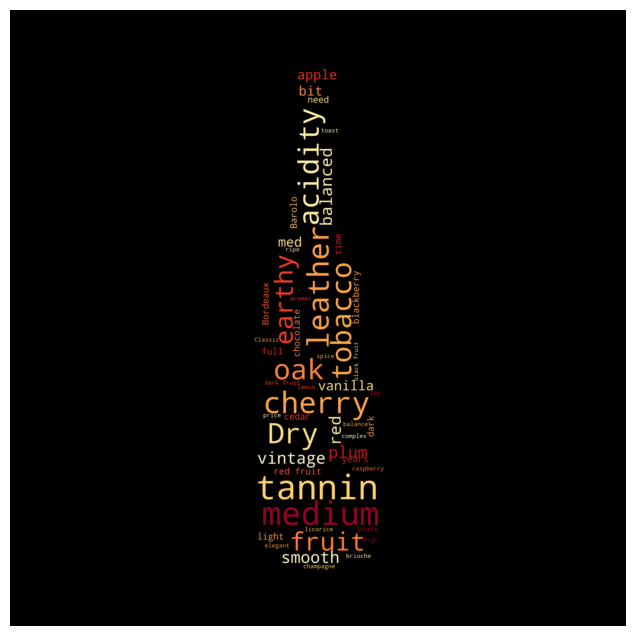

This is the wordcloud of the recommendation list looks like...


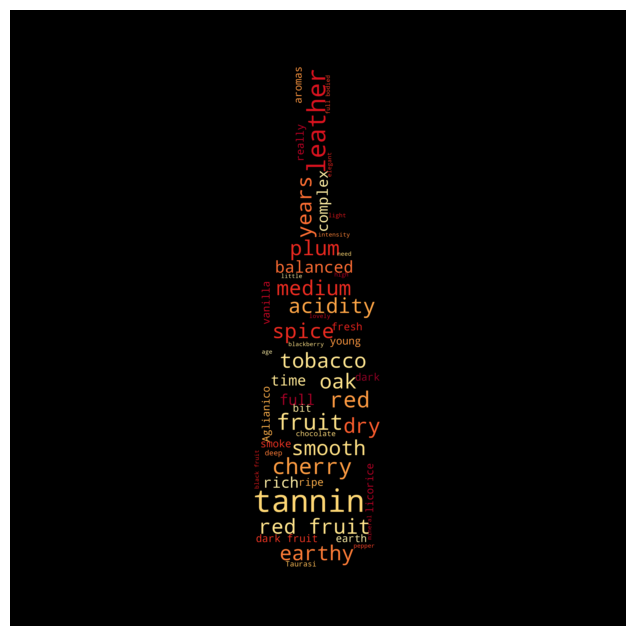

In [28]:
user_sample_1_review = ' '.join(user_sample.Review.tolist())
print('This is the wordcloud of the user list looks like...')
make_wordcloud(user_sample_1_review, stopwords_list, "picture/wine_image.jpg")
recomendation_list_review = ' '.join(recomendation_list.Review.tolist())
print('This is the wordcloud of the recommendation list looks like...')
make_wordcloud(recomendation_list_review, stopwords_list, "picture/wine_image.jpg")